In [ ]:
# 컴퓨터가 바라보는 이미지 파일에 대한 이해
# openCV : C, JAVA, python etc
# 파이썬에서는 cv2라고 함
# 로컬에서는 설치 필요, colab에서는 기본 제공됨
# 단, colab 에서는 RGB 순이 아니라 BGR 순이라 튜닝이 필요!

In [5]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
# 새로운 팝업창 띄우지 않고 셀 아래 즉시 결과 보여줌
%matplotlib inline

import os
import numpy as np

import cv2


In [6]:
cv2.__version__

#버전 확인! (참조 코드 시기에 따라 cv버전 탈 수 있음)

'4.8.0'

# < 채널 >

* 이미지와 색공간
- **0 ~ 255 사이의 값**으로 밝기를 표현

- color: 3차원 (true color 라고도 불림)

  <img src="https://upload.wikimedia.org/wikipedia/commons/8/83/RGB_Cube_Show_lowgamma_cutout_b.png" width="500">
  <img src="https://upload.wikimedia.org/wikipedia/commons/b/b0/RGB_color_space_animated_view.gif">

  <img src="https://upload.wikimedia.org/wikipedia/commons/thumb/3/33/Beyoglu_4671_tricolor.png/400px-Beyoglu_4671_tricolor.png" width="600">

  <sub>[이미지 출처] https://en.wikipedia.org/wiki/RGB_color_space  
  https://commons.wikimedia.org/wiki/File:RGB_color_space_animated_view.gif</sub>

- gray scale: 2차원
  - 0~255의 값을 통해 밝기를 표현
  - 0으로 갈수록 어두워지고, 255로 갈수록 밝아짐

  <img src="https://miro.medium.com/max/1400/1*euc4RxnNo78LFEGrb-QZ7w.jpeg">

  <sub>[이미지 출처] https://medium.com/@himnickson/converting-rgb-image-to-the-grayscale-image-in-java-9e1edc5bd6e7</sub>
  
  <img src="https://ai.stanford.edu/~syyeung/cvweb/Pictures1/imagematrix.png">

  <sub>[이미지 출처] https://ai.stanford.edu/~syyeung/cvweb/tutorial1.html</sub>

- BMP
  - 픽셀 데이터를 압축하지 않은 상태로 저장

  - 파일 구조 간단하지만 용량이 매우 큼

- JPG(JPEG)
  - 손실 압축(lossy compression) 사용

  - 원본 영상으로부터 픽셀값이 미세하게 달라짐

  - 파일 용량 크기가 크게 감소하는 점에서 장점

  - 디지털 카메라

- GIF
  - 무손실 압축(losses compression)

  - 움직이는 그림인 Animation GIF 지원

  - **256 이하의 색상을 가진 영상만을 저장**하고, 화질이 매우 떨어짐

- PNG
  - Portable Network Graphics

  - 무손실 압축 사용

  - 용량은 큰 편이지만 픽셀값이 변경되지 않음

  - $\alpha$ 채널을 지원하여 일부분을 투명하게 설정 가능

In [7]:
# 직접 업로드해도 됨!!

!gdown 1cHcUDb4ziI6UKr4Xq1aLRqS8JCNM-aHf

Downloading...
From: https://drive.google.com/uc?id=1cHcUDb4ziI6UKr4Xq1aLRqS8JCNM-aHf
To: /content/sohn.jpg
100% 339k/339k [00:00<00:00, 80.1MB/s]


In [8]:
img_path ="/content/sohn.jpg"
image = cv2.imread(img_path)
print(image.shape)

(1496, 2047, 3)


# colab과 일반 cv 비교

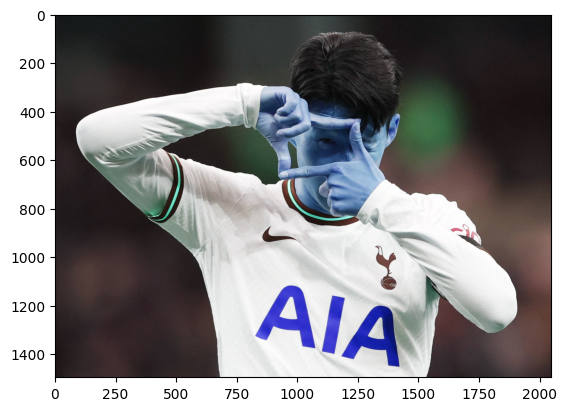

In [9]:
plt.imshow(image)
# colab 채널 순서 : BGR 순 (우리가 아는 RGB 순이 아님)
# colab 에서 이미지 출력에는 문제 없지만 그대로 출력하냐는 다름

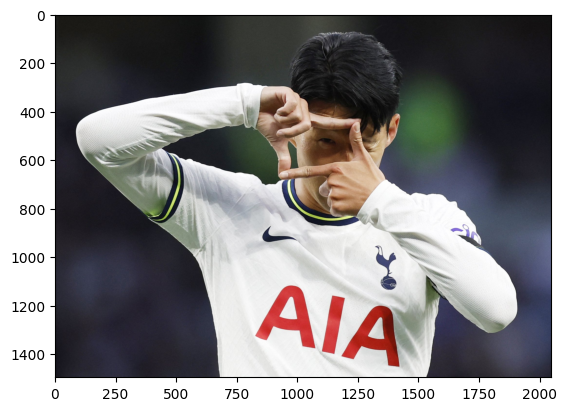

In [10]:
imgRGB = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(imgRGB)

# colab에서 이미지 보기

In [ ]:
# local : cv2.imshow(image)
# colab : cv2_imshow(image) : local 명령어가 안돼서 유사하게 만듬


(1496, 2047, 3)


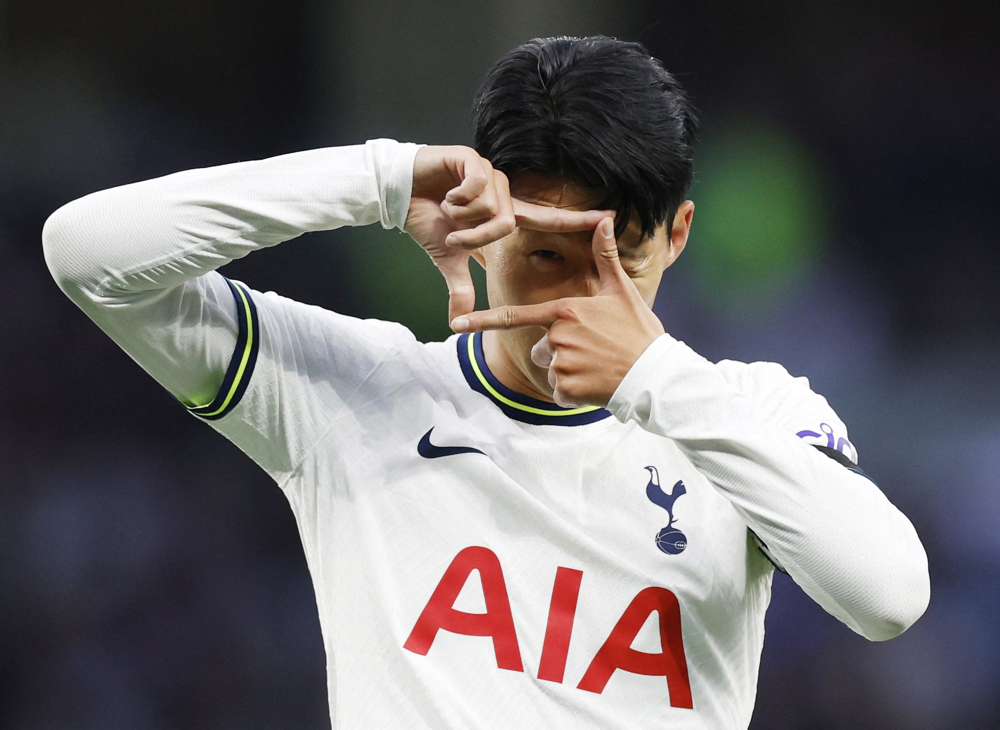

In [11]:
from google.colab.patches import cv2_imshow

img = cv2.imread(img_path)
print(img.shape)
cv2_imshow(img)

# 이미지 정보들 확인 : 모양/ 채널/ 채널분리 및 병합



In [ ]:
type(img)
# ---> 이미지 데이터가 numpy의 array 형식!!!
# ---> 벡터연산,,,슬라이싱()....

numpy.ndarray

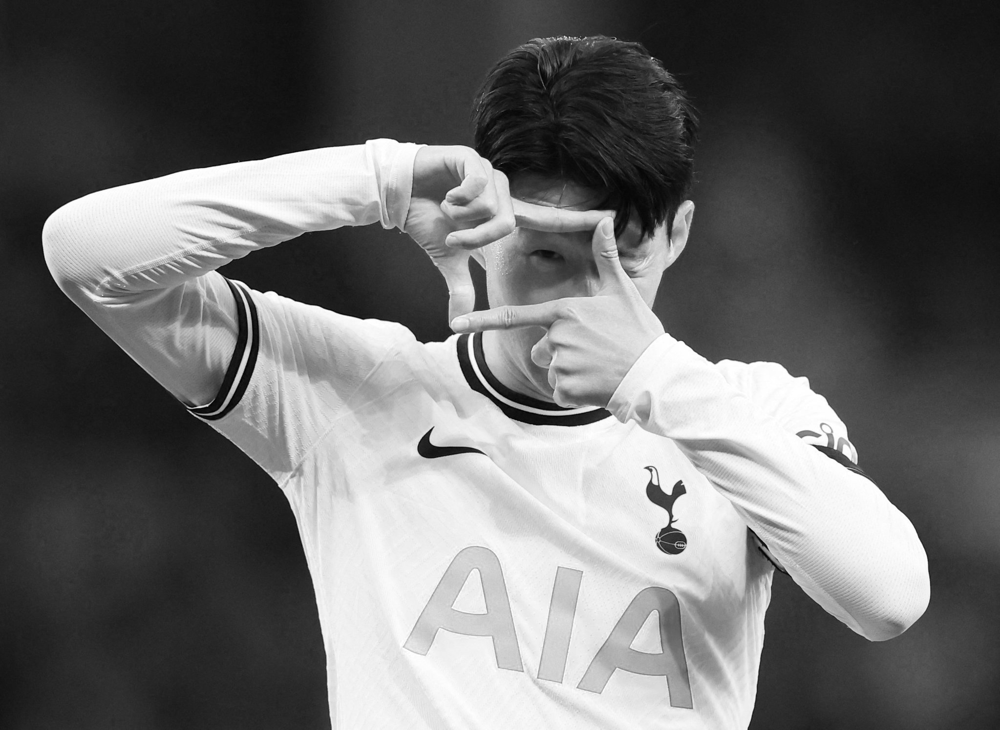

In [14]:
# RGB에서 하나의 판만 가지고 오겠다....
# cv2_imshow(img[:,:,0])
# cv2_imshow(img[:,:,1])
cv2_imshow(img[:,:,2])

In [ ]:
# 참고)
# 간단하게 흑백을 만드는 과정은 채널을 하나만 들고올 수 있음
# -> 선택한 채널의 특성만 반영됨
# -> 명시적 컬러를 흑백으로 반환하는 룰을 통해서 하는 것

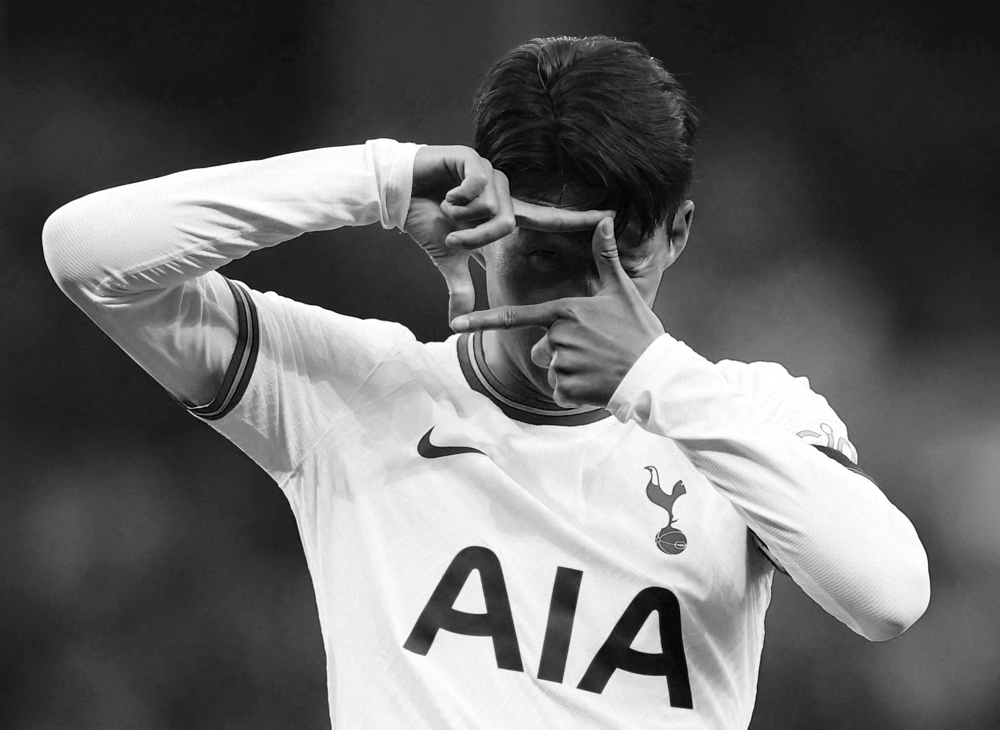

None


In [18]:
# 참고) 인덱스를 사용하지 않고, 분리 split만들어 둠
r, g, b =  cv2.split(img)
print(cv2_imshow(r))

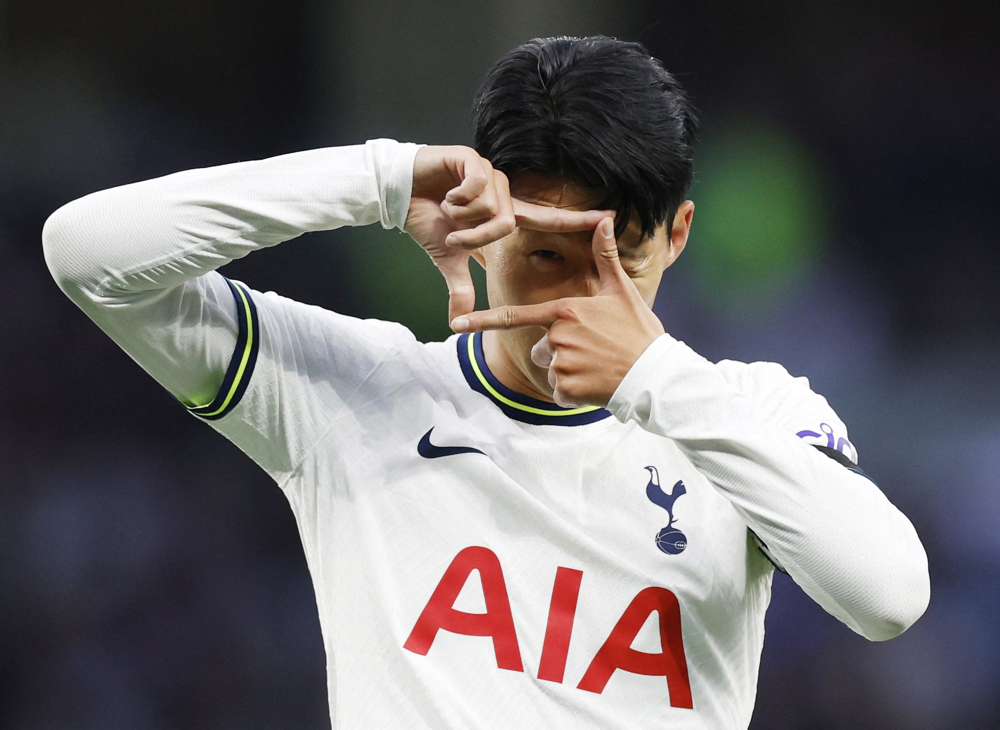

In [20]:
# 참고) 분리 처리된 이미지 채널들을 합칠 수 있음
# cv2.merge
temp = cv2.merge([r,g,b]) # 순서가 중요
cv2_imshow(temp)

In [21]:
# FM적으로 컬러이미지를 흑백으로 변환을 할 때;...
g = cv2.cvtColor( img, cv2.COLOR_RGB2GRAY)
# --> RGB ---> Gray
print("Org RGB:", img.shape)
print("Gray ")

Org RGB: (1496, 2047, 3)
Gray 


# < 사이즈 및 조정 >

In [ ]:
# 이미지 데이터는 기본적으로 Array 형식

# 앞에서는 채널 중심으로 확인. 이번에는 사이즈 중심으로 확인해 봄.

# 이동 시키기

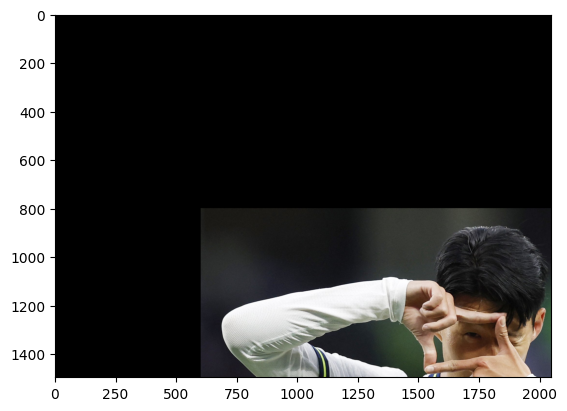

In [28]:
tx = 600
ty = 800

trans_mtrx = np.float32([[1,0, tx],
                        [0, 1, ty]])

trans_image = cv2.warpAffine(imgRGB, trans_mtrx, (image.shape[1], image.shape[0]))

plt.imshow(trans_image)

In [32]:
print(imgRGB.shape)
print(imgRGB.shape[2])
print(imgRGB.shape[:2])

(1496, 2047, 3)
3
(1496, 2047)


# 회전 시키기

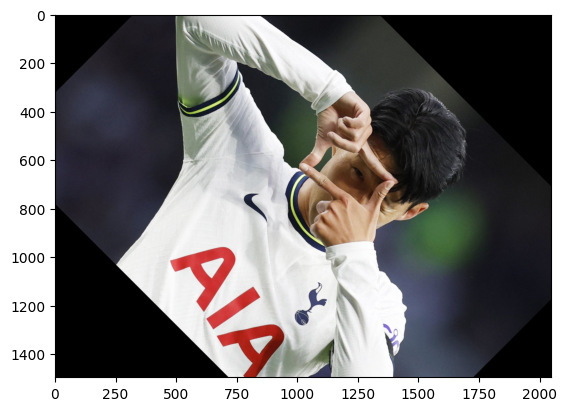

In [36]:
angle = -45

height, width = imgRGB.shape[:2]
center = (width // 2, height // 2)

rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
rotated_image = cv2.warpAffine(imgRGB, rotation_matrix, (width, height))

plt.imshow(rotated_image)

# resize

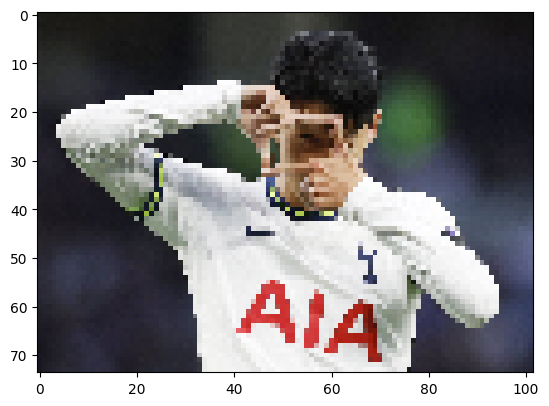

In [ ]:
scale_width = 0.05
scale_height = 0.05

new_width = int(imgRGB.shape[1] * scale_width)
new_height = int(imgRGB.shape[0] * scale_height)

scaled_image = cv2.resize(imgRGB, (new_width, new_height))

plt.imshow(scaled_image)

In [ ]:
# 개별 이미지 변환, 변경, 전처리 하고 싶ㅍ을 때
# 여러 패키지들이 존재하지만
# opencv